In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error

In [3]:
df=pd.read_csv('Mobile.csv')

In [4]:
df.sample(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
394,1945,0,1.6,1,0,1,57,0.3,195,4,...,743,1753,732,14,1,14,1,1,0,1
344,618,0,2.1,0,2,0,6,0.3,86,1,...,1314,1688,1051,13,10,15,0,0,1,0
1363,796,0,0.5,0,2,0,12,0.5,114,1,...,174,518,1075,7,3,2,0,1,0,0
1309,1433,1,2.3,0,2,1,5,0.1,129,5,...,420,784,2132,18,15,19,1,0,1,1
600,1170,0,2.9,1,2,0,40,0.4,169,6,...,427,684,2366,16,8,2,1,1,1,1


# First finding what algorithm to be used?

In [47]:
df['price_range'].min()

0

In [48]:
df['price_range'].max()

3

- Since the dependent feature is a categorical column
- We will use Logistic Regression model here

In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

- Observations count : 2000
- Feature count : 21
- Categorical features : blue,dual_sim,4g,3g,touch screen,wifi
- Continous features : clockspeed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time
- Target feature : price_range
- No null values in the dataset

### Check for null values

In [50]:
df.isnull().sum().sum()

0

- We have no null values
- So we need not worry about missing values which will affect our model later

### Check for duplicates

In [51]:
df.duplicated().sum()

0

- There are no duplicate observations
- We need not drop any then

### Plot a pairplot and box plot

In [15]:
sns.pairplot(data=df,diag_kind='kde',corner=True,height=10);

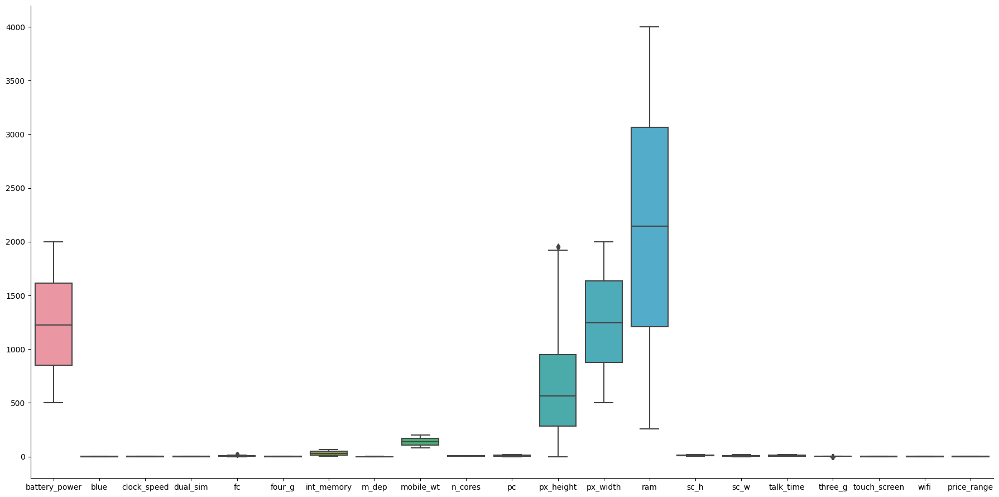

In [28]:
sns.catplot(kind='box',data=df,height=9,aspect=2);

- There are outliers in dataset
- We need not deal with outliers 
- Because there are no many records and if we deal with outliers
- Either we will replace it with any other value or drop them
- This will affect the originality of our dataset
- Result in poor model

### ENCODE FEATURES

- One hot encode Touch screen feature

In [5]:
def to_onehotencode(X):
    return pd.get_dummies(data=X)

In [6]:
df1=to_onehotencode(df['touch_screen'])

In [7]:
df1.columns=['touch_screen_0','touch_screen_1']

In [8]:
df=pd.concat((df,df1),axis=1)

# Train test split

In [23]:
X = df.drop('price_range',axis=1)

In [24]:
y = df[['price_range']]

In [25]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=900,stratify=y)

### Scaling the dataset

In [26]:
def scaling(x):
    sc=StandardScaler()
    return pd.DataFrame(sc.fit_transform(x))

In [27]:
X_train=scaling(X_train)

In [28]:
X_test=scaling(X_test)

### Fitting dataset into model

In [29]:
log_reg=LogisticRegression()

In [37]:
log_reg.fit(X_train,y_train)

LogisticRegression()

In [38]:
log_reg.score(X_train,y_train)

0.98

In [39]:
log_reg.score(X_test,y_test)

0.958

In [40]:
pred=pd.DataFrame(log_reg.predict(X_test))

In [41]:
pred.columns=['Predicted']

In [42]:
mean_squared_error(y_test,pred['Predicted'])

0.042

- MSE IS 0.042
- R square is 98%